# **VENUE WISE ANALYSIS IN TRAIN, VALIDATION, AND TEST DATA**

* Using version B of released dataset (split by sensor)
* train = sensors 130, 133, 134, 136, 137 

  valid = sensors 132, 139
  
  test = sensors 140, 143, 146

In [77]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [78]:
sns.set_style('whitegrid')

# **1. LOAD DATASET**

In [79]:
train_url = 'https://drive.google.com/uc?id=1r8xfRQIeA00sgt_CKU-WwsXBbjeZip2g'
val_url = 'https://drive.google.com/uc?id=1EkNEn3mok3CVrz8mwBpoxJGQPUReCJ2u'
test_url = 'https://drive.google.com/uc?id=1C5tjrnpq75skQy8-Q7xbXxOOJIVtkY_h'

In [80]:
train = pd.read_csv(train_url) 
val = pd.read_csv(val_url) 
test = pd.read_csv(test_url) 

In [81]:
train

,sensor_node_id,scan_time,temp_0,temp_1,temp_2,temp_3,temp_4,temp_5,temp_6,temp_7,temp_8,temp_9,humid_0,humid_1,humid_2,humid_3,humid_4,humid_5,humid_6,humid_7,humid_8,humid_9,gas_scan_0,gas_scan_1,gas_scan_2,gas_scan_3,gas_scan_4,gas_scan_5,gas_scan_6,gas_scan_7,gas_scan_8,gas_scan_9,gas_scan_cnt,encoded_specimen,trigger,burn_material,burn_material_amount(g),end_time,hotplate_start,hotplate_temp,experiment,sensor_hotplate_distance,start_time,venue
0,137,2021-09-01 09:02:12.939383029+00:00,19.2,19.4,20.0,20.0,20.1,20.4,20.5,20.5,20.7,20.8,74,74,72,72,72,71,70,70,69,69,30291600,76400,1823600,69300,294100,252400,234800,69000,160600,200800,1,0,manual,SP2,600.0,2021-09-01 18:50:46+00:00,2021-09-01 10:03:57+00:00,500,6,30m,2021-09-01 08:30:22+00:00,hall
1,137,2021-09-01 09:02:49.563847064+00:00,19.6,19.7,20.2,20.2,20.3,20.6,20.6,20.6,20.8,20.9,69,70,70,70,69,69,69,69,68,68,102400000,144100,4785000,120800,577300,472900,416600,106100,196100,224900,2,0,manual,SP2,600.0,2021-09-01 18:50:46+00:00,2021-09-01 10:03:57+00:00,500,6,30m,2021-09-01 08:30:22+00:00,hall
2,137,2021-09-01 09:03:26.179350+00:00,19.6,19.8,20.3,20.3,20.4,20.6,20.7,20.7,20.9,20.9,69,69,69,69,69,69,68,68,68,68,102400000,160600,5610900,133400,649900,532300,466800,115400,208000,238800,3,0,manual,SP2,600.0,2021-09-01 18:50:46+00:00,2021-09-01 10:03:57+00:00,500,6,30m,2021-09-01 08:30:22+00:00,hall
3,137,2021-09-01 09:04:02.821827+00:00,19.7,19.9,20.4,20.4,20.5,20.7,20.7,20.7,20.9,21.0,68,68,69,69,69,68,68,68,68,67,102400000,167900,6073700,139100,682400,560300,489200,119000,215000,245100,4,0,manual,SP2,600.0,2021-09-01 18:50:46+00:00,2021-09-01 10:03:57+00:00,500,6,30m,2021-09-01 08:30:22+00:00,hall
4,137,2021-09-01 09:04:39.888919115+00:00,19.7,19.9,20.4,20.4,20.5,20.7,20.8,20.8,21.0,21.0,68,68,69,68,69,68,68,68,68,67,102400000,156300,5593700,131700,645000,528200,465800,114900,214900,245500,5,0,manual,SP2,600.0,2021-09-01 18:50:46+00:00,2021-09-01 10:03:57+00:00,500,6,30m,2021-09-01 08:30:22+00:00,hall
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1384,130,2021-09-09 13:54:01.448236942+00:00,25.4,25.5,26.1,26.1,26.2,26.4,26.5,26.5,26.7,26.7,44,44,44,44,44,44,44,44,43,43,102400000,231900,6566700,178800,902700,677000,553000,141400,295900,349200,2,1,manual,BM2,0.2,2021-09-09 14:40:40+00:00,2021-09-09 12:56:39+00:00,250,15,4m,2021-09-09 12:00:24+00:00,chamber
1385,130,2021-09-09 13:54:38.105902910+00:00,25.5,25.6,26.1,26.2,26.3,26.5,26.6,26.6,26.8,26.8,44,44,44,44,44,44,43,43,43,43,102400000,251600,7474400,198600,1002900,745800,607700,151700,308500,362200,3,1,manual,BM2,0.2,2021-09-09 14:40:40+00:00,2021-09-09 12:56:39+00:00,250,15,4m,2021-09-09 12:00:24+00:00,chamber
1386,130,2021-09-09 13:55:14.770633935+00:00,25.5,25.7,26.2,26.2,26.3,26.6,26.6,26.6,26.8,26.9,43,43,44,43,44,43,43,43,43,43,102400000,264500,8161300,207000,1067200,786300,646200,157900,318900,378300,4,1,manual,BM2,0.2,2021-09-09 14:40:40+00:00,2021-09-09 12:56:39+00:00,250,15,4m,2021-09-09 12:00:24+00:00,chamber
1387,130,2021-09-09 13:55:51.865952014+00:00,25.6,25.7,26.3,26.3,26.4,26.6,26.6,26.6,26.8,26.9,43,43,43,43,43,43,43,43,43,43,102400000,259300,8076900,206000,1057300,780900,643800,157900,320100,381000,5,1,manual,BM2,0.2,2021-09-09 14:40:40+00:00,2021-09-09 12:56:39+00:00,250,15,4m,2021-09-09 12:00:24+00:00,chamber


In [82]:
val

,sensor_node_id,scan_time,temp_0,temp_1,temp_2,temp_3,temp_4,temp_5,temp_6,temp_7,temp_8,temp_9,humid_0,humid_1,humid_2,humid_3,humid_4,humid_5,humid_6,humid_7,humid_8,humid_9,gas_scan_0,gas_scan_1,gas_scan_2,gas_scan_3,gas_scan_4,gas_scan_5,gas_scan_6,gas_scan_7,gas_scan_8,gas_scan_9,gas_scan_cnt,encoded_specimen,trigger,burn_material,burn_material_amount(g),end_time,hotplate_start,hotplate_temp,experiment,sensor_hotplate_distance,start_time,venue
0,139,2021-09-01 08:58:37.190576076+00:00,18.9,19.0,19.6,19.6,19.7,20.0,20.1,20.0,20.2,20.3,75,75,73,73,73,72,71,71,70,70,102400000,153100,5097600,132800,661900,525300,461400,118300,250700,301900,1,0,manual,SP2,600.0,2021-09-01 18:50:46+00:00,2021-09-01 10:03:57+00:00,500,6,30m,2021-09-01 08:30:22+00:00,hall
1,139,2021-09-01 08:59:13.819256067+00:00,19.2,19.3,19.8,19.8,19.9,20.1,20.2,20.2,20.4,20.4,70,70,70,70,70,70,69,69,69,69,102400000,228100,9009600,192600,1033200,811500,692800,160300,290400,331200,2,0,manual,SP2,600.0,2021-09-01 18:50:46+00:00,2021-09-01 10:03:57+00:00,500,6,30m,2021-09-01 08:30:22+00:00,hall
2,139,2021-09-01 08:59:50.441437959+00:00,19.3,19.4,19.9,19.9,20.0,20.2,20.3,20.3,20.4,20.5,69,69,69,69,69,69,69,69,69,68,102400000,252500,10590800,211700,1155700,916700,779500,174400,306000,345700,3,0,manual,SP2,600.0,2021-09-01 18:50:46+00:00,2021-09-01 10:03:57+00:00,500,6,30m,2021-09-01 08:30:22+00:00,hall
3,139,2021-09-01 09:00:27.082521915+00:00,19.3,19.5,20.0,20.0,20.0,20.3,20.3,20.3,20.5,20.5,69,69,69,69,69,69,69,68,68,68,102400000,261600,11303200,219400,1214300,972900,821800,180900,313600,354300,4,0,manual,SP2,600.0,2021-09-01 18:50:46+00:00,2021-09-01 10:03:57+00:00,500,6,30m,2021-09-01 08:30:22+00:00,hall
4,139,2021-09-01 09:01:04.330970+00:00,19.4,19.5,20.0,20.0,20.1,20.3,20.4,20.3,20.5,20.6,69,69,69,69,69,69,68,68,68,68,102400000,255400,11074000,218000,1204700,962600,814400,178600,313600,356100,5,0,manual,SP2,600.0,2021-09-01 18:50:46+00:00,2021-09-01 10:03:57+00:00,500,6,30m,2021-09-01 08:30:22+00:00,hall
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
453,132,2021-09-09 14:01:32.662157058+00:00,25.3,25.5,26.0,26.0,26.1,26.4,26.4,26.4,26.6,26.7,44,44,44,44,44,44,44,44,43,43,102400000,184200,6531300,150500,804800,615900,511600,121100,237300,274700,2,1,manual,BM2,0.2,2021-09-09 14:40:40+00:00,2021-09-09 12:56:39+00:00,250,15,4m,2021-09-09 12:00:24+00:00,chamber
454,132,2021-09-09 14:02:09.267132997+00:00,25.4,25.6,26.1,26.1,26.2,26.5,26.5,26.5,26.7,26.7,44,44,44,44,44,44,43,43,43,43,102400000,205200,7383500,162100,888100,680300,563100,130200,248700,284800,3,1,manual,BM2,0.2,2021-09-09 14:40:40+00:00,2021-09-09 12:56:39+00:00,250,15,4m,2021-09-09 12:00:24+00:00,chamber
455,132,2021-09-09 14:02:46.403394937+00:00,25.5,25.6,26.2,26.2,26.3,26.5,26.6,26.5,26.7,26.8,43,43,43,43,43,43,43,43,43,43,102400000,202600,7255900,161200,880100,676300,564900,129700,253100,289100,4,1,manual,BM2,0.2,2021-09-09 14:40:40+00:00,2021-09-09 12:56:39+00:00,250,15,4m,2021-09-09 12:00:24+00:00,chamber
456,132,2021-09-09 14:03:23.037255048+00:00,25.5,25.7,26.2,26.2,26.3,26.6,26.6,26.6,26.8,26.8,43,43,43,43,43,43,43,43,43,42,102400000,216800,8029400,172800,960600,731400,607100,137000,260800,295900,5,1,manual,BM2,0.2,2021-09-09 14:40:40+00:00,2021-09-09 12:56:39+00:00,250,15,4m,2021-09-09 12:00:24+00:00,chamber


In [83]:
test

,sensor_node_id,scan_time,temp_0,temp_1,temp_2,temp_3,temp_4,temp_5,temp_6,temp_7,temp_8,temp_9,humid_0,humid_1,humid_2,humid_3,humid_4,humid_5,humid_6,humid_7,humid_8,humid_9,gas_scan_0,gas_scan_1,gas_scan_2,gas_scan_3,gas_scan_4,gas_scan_5,gas_scan_6,gas_scan_7,gas_scan_8,gas_scan_9,gas_scan_cnt,encoded_specimen,trigger,burn_material,burn_material_amount(g),end_time,hotplate_start,hotplate_temp,experiment,sensor_hotplate_distance,start_time,venue
0,146,2021-09-01 09:01:36.817528009+00:00,18.8,19.0,19.6,19.6,19.7,20.0,20.1,20.1,20.3,20.4,74,74,72,72,72,71,70,70,69,69,102400000,198100,7285000,168200,855800,692100,613100,150400,300900,364900,1,0,manual,SP2,600.0,2021-09-01 18:50:46+00:00,2021-09-01 10:03:57+00:00,500,6,30m,2021-09-01 08:30:22+00:00,hall
1,146,2021-09-01 09:02:13.375891+00:00,19.2,19.3,19.8,19.8,19.9,20.2,20.2,20.2,20.4,20.5,69,69,69,69,69,69,68,68,68,68,102400000,293900,13181000,254800,1375800,1115100,971500,216100,358000,416900,2,0,manual,SP2,600.0,2021-09-01 18:50:46+00:00,2021-09-01 10:03:57+00:00,500,6,30m,2021-09-01 08:30:22+00:00,hall
2,146,2021-09-01 09:02:50.057426+00:00,19.3,19.4,19.9,19.9,20.0,20.3,20.3,20.3,20.5,20.5,68,68,68,68,68,68,68,68,67,67,102400000,329300,15918300,286200,1618300,1293700,1126200,241500,392200,440300,3,0,manual,SP2,600.0,2021-09-01 18:50:46+00:00,2021-09-01 10:03:57+00:00,500,6,30m,2021-09-01 08:30:22+00:00,hall
3,146,2021-09-01 09:03:26.565743+00:00,19.3,19.5,20.0,20.0,20.1,20.3,20.4,20.3,20.5,20.6,68,68,68,68,68,68,68,67,67,67,102400000,350300,17541700,300900,1726800,1395500,1204700,254200,408900,453400,4,0,manual,SP2,600.0,2021-09-01 18:50:46+00:00,2021-09-01 10:03:57+00:00,500,6,30m,2021-09-01 08:30:22+00:00,hall
4,146,2021-09-01 09:04:03.635421991+00:00,19.4,19.5,20.0,20.0,20.1,20.4,20.4,20.4,20.6,20.6,68,68,68,68,68,68,67,67,67,67,102400000,343900,17305500,296200,1697800,1378600,1195200,252000,408200,456800,5,0,manual,SP2,600.0,2021-09-01 18:50:46+00:00,2021-09-01 10:03:57+00:00,500,6,30m,2021-09-01 08:30:22+00:00,hall
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
646,140,2021-09-09 14:01:33.398730039+00:00,25.6,25.7,26.2,26.3,26.4,26.6,26.7,26.6,26.9,26.9,53,53,53,53,53,53,53,53,53,53,102400000,385600,16916800,339800,1901100,1480300,1217500,259800,355000,401700,2,1,manual,BM2,0.2,2021-09-09 14:40:40+00:00,2021-09-09 12:56:39+00:00,250,15,4m,2021-09-09 12:00:24+00:00,chamber
647,140,2021-09-09 14:02:10.090806961+00:00,25.7,25.9,26.3,26.4,26.4,26.7,26.7,26.7,26.9,27.0,53,53,53,53,53,53,53,53,53,53,102400000,377500,16557800,335800,1877600,1473900,1229600,261800,360600,414100,3,1,manual,BM2,0.2,2021-09-09 14:40:40+00:00,2021-09-09 12:56:39+00:00,250,15,4m,2021-09-09 12:00:24+00:00,chamber
648,140,2021-09-09 14:02:46.800478935+00:00,25.8,25.9,26.4,26.4,26.5,26.7,26.8,26.8,27.0,27.0,53,53,53,53,53,53,53,53,53,53,102400000,388600,17374300,346000,1972500,1569000,1287600,270800,378700,427600,4,1,manual,BM2,0.2,2021-09-09 14:40:40+00:00,2021-09-09 12:56:39+00:00,250,15,4m,2021-09-09 12:00:24+00:00,chamber
649,140,2021-09-09 14:03:23.476608991+00:00,25.8,25.9,26.4,26.5,26.6,26.8,26.8,26.8,27.0,27.1,53,53,53,53,53,53,53,53,53,53,102400000,402400,18476400,357600,2040300,1640600,1356700,280300,392400,439200,5,1,manual,BM2,0.2,2021-09-09 14:40:40+00:00,2021-09-09 12:56:39+00:00,250,15,4m,2021-09-09 12:00:24+00:00,chamber


# **2. BASIC CHECKING AND FIX IT**

In [84]:
# data dimension

print(train.shape)
print(val.shape)
print(test.shape)

(1389, 44)
(458, 44)
(651, 44)


In [85]:
columns_included = ['temp_0', 'temp_1', 'temp_2', 'temp_3',
                    'temp_4', 'temp_5', 'temp_6', 'temp_7', 'temp_8', 'temp_9', 'humid_0',
                    'humid_1', 'humid_2', 'humid_3', 'humid_4', 'humid_5', 'humid_6',
                    'humid_7', 'humid_8', 'humid_9', 'gas_scan_0', 'gas_scan_1',
                    'gas_scan_2', 'gas_scan_3', 'gas_scan_4', 'gas_scan_5', 'gas_scan_6',
                    'gas_scan_7', 'gas_scan_8', 'gas_scan_9', 'encoded_specimen']

In [86]:
train[columns_included].describe()

,temp_0,temp_1,temp_2,temp_3,temp_4,temp_5,temp_6,temp_7,temp_8,temp_9,humid_0,humid_1,humid_2,humid_3,humid_4,humid_5,humid_6,humid_7,humid_8,humid_9,gas_scan_0,gas_scan_1,gas_scan_2,gas_scan_3,gas_scan_4,gas_scan_5,gas_scan_6,gas_scan_7,gas_scan_8,gas_scan_9,encoded_specimen
count,1389.000000,1389.000000,1389.000000,1389.000000,1389.000000,1389.000000,1389.000000,1389.000000,1389.000000,1389.000000,1389.000000,1389.000000,1389.000000,1389.000000,1389.000000,1389.000000,1389.000000,1389.000000,1389.00000,1389.000000,1.389000e+03,1.389000e+03,1.389000e+03,1389.000000,1.389000e+03,1.389000e+03,1.389000e+03,1389.000000,1389.000000,1389.000000,1389.000000
mean,22.466451,22.614183,23.144564,23.159899,23.245932,23.495680,23.550108,23.533837,23.742693,23.801152,60.164867,60.218143,59.910727,59.894888,59.904968,59.611951,59.244060,59.226782,59.00000,58.683945,7.726707e+07,2.684839e+05,1.305161e+07,231628.077754,1.349370e+06,1.108435e+06,9.598739e+05,192347.804176,311405.111591,353153.563715,0.798416
std,1.704498,1.706225,1.706770,1.707222,1.706140,1.707201,1.704895,1.706854,1.706269,1.704571,6.852462,6.844975,6.625149,6.619041,6.618323,6.548194,6.468181,6.467251,6.43791,6.376077,3.703501e+07,2.243366e+05,1.642560e+07,206853.871846,1.437282e+06,1.252976e+06,1.116439e+06,174801.720743,206169.728688,223863.503941,0.401328
min,18.700000,18.900000,19.500000,19.500000,19.600000,19.900000,19.900000,19.900000,20.200000,20.200000,40.000000,40.000000,40.000000,40.000000,40.000000,40.000000,40.000000,39.000000,39.00000,39.000000,2.130000e+04,5.600000e+03,8.000000e+03,5600.000000,7.400000e+03,6.900000e+03,7.000000e+03,5600.000000,20800.000000,27900.000000,0.000000
25%,21.300000,21.400000,21.900000,21.900000,22.000000,22.300000,22.300000,22.300000,22.500000,22.600000,56.000000,56.000000,56.000000,56.000000,56.000000,56.000000,56.000000,56.000000,55.00000,55.000000,4.783640e+07,9.160000e+04,1.394100e+06,70900.000000,2.936000e+05,2.025000e+05,1.662000e+05,60000.000000,148600.000000,173500.000000,1.000000
50%,22.000000,22.100000,22.600000,22.700000,22.700000,23.000000,23.100000,23.000000,23.300000,23.300000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,60.000000,60.000000,60.00000,60.000000,1.024000e+08,1.782000e+05,5.305600e+06,144200.000000,6.824000e+05,5.270000e+05,4.338000e+05,115300.000000,235100.000000,276700.000000,1.000000
75%,23.500000,23.700000,24.200000,24.200000,24.300000,24.500000,24.600000,24.600000,24.800000,24.800000,65.000000,65.000000,65.000000,65.000000,65.000000,65.000000,64.000000,64.000000,64.00000,64.000000,1.024000e+08,4.159000e+05,1.976350e+07,349600.000000,2.010300e+06,1.662600e+06,1.417300e+06,284100.000000,453100.000000,515800.000000,1.000000
max,28.800000,28.900000,29.400000,29.500000,29.600000,29.800000,29.800000,29.900000,30.100000,30.100000,76.000000,76.000000,74.000000,74.000000,74.000000,73.000000,72.000000,72.000000,71.00000,70.000000,1.024000e+08,1.107000e+06,8.555610e+07,967400.000000,7.095700e+06,6.176800e+06,5.448600e+06,797800.000000,926000.000000,989100.000000,1.000000


In [87]:
val[columns_included].describe()

,temp_0,temp_1,temp_2,temp_3,temp_4,temp_5,temp_6,temp_7,temp_8,temp_9,humid_0,humid_1,humid_2,humid_3,humid_4,humid_5,humid_6,humid_7,humid_8,humid_9,gas_scan_0,gas_scan_1,gas_scan_2,gas_scan_3,gas_scan_4,gas_scan_5,gas_scan_6,gas_scan_7,gas_scan_8,gas_scan_9,encoded_specimen
count,458.000000,458.000000,458.000000,458.000000,458.000000,458.000000,458.000000,458.000000,458.000000,458.000000,458.000000,458.000000,458.000000,458.000000,458.000000,458.000000,458.000000,458.000000,458.000000,458.000000,4.580000e+02,458.000000,4.580000e+02,458.000000,4.580000e+02,4.580000e+02,4.580000e+02,458.000000,458.000000,458.000000,458.000000
mean,22.114192,22.257424,22.793231,22.798253,22.883406,23.124017,23.177948,23.153275,23.355459,23.411354,60.504367,60.534934,60.248908,60.233624,60.233624,59.943231,59.578603,59.554585,59.327511,59.026201,7.893601e+07,192550.873362,8.267993e+06,161969.868996,8.999378e+05,7.230203e+05,6.235258e+05,136192.576419,246039.519651,281222.925764,0.818777
std,1.617747,1.620182,1.622725,1.626126,1.625611,1.626016,1.626818,1.626840,1.628743,1.630347,6.844713,6.842067,6.607738,6.594873,6.592218,6.555690,6.488109,6.472486,6.465000,6.445816,3.698382e+07,134986.282346,1.032658e+07,122466.839563,8.291857e+05,7.423651e+05,6.681167e+05,104680.688748,129243.876429,144096.856781,0.385624
min,18.700000,18.800000,19.500000,19.500000,19.500000,19.800000,19.900000,19.900000,20.100000,20.200000,43.000000,43.000000,43.000000,43.000000,43.000000,43.000000,43.000000,43.000000,42.000000,42.000000,5.182000e+05,19200.000000,6.150000e+04,16800.000000,4.530000e+04,2.800000e+04,2.430000e+04,17000.000000,45000.000000,52700.000000,0.000000
25%,20.900000,21.100000,21.600000,21.600000,21.700000,21.900000,22.000000,21.900000,22.200000,22.200000,55.000000,55.000000,55.000000,55.000000,55.000000,55.000000,55.000000,55.000000,54.250000,54.000000,5.356580e+07,89875.000000,1.408100e+06,72625.000000,3.114500e+05,2.016000e+05,1.573500e+05,62525.000000,153175.000000,184475.000000,1.000000
50%,21.700000,21.900000,22.400000,22.400000,22.500000,22.750000,22.800000,22.800000,23.000000,23.000000,61.000000,61.000000,61.000000,61.000000,61.000000,60.000000,60.000000,60.000000,60.000000,59.500000,1.024000e+08,162900.000000,4.553600e+06,133000.000000,6.680500e+05,4.899000e+05,4.025000e+05,107600.000000,234300.000000,267150.000000,1.000000
75%,23.200000,23.400000,23.975000,23.900000,24.000000,24.275000,24.300000,24.300000,24.500000,24.500000,66.000000,66.000000,66.000000,66.000000,66.000000,66.000000,65.000000,65.000000,65.000000,65.000000,1.024000e+08,250100.000000,1.076312e+07,211225.000000,1.154475e+06,9.519000e+05,8.108250e+05,173275.000000,305525.000000,353900.000000,1.000000
max,26.100000,26.300000,26.800000,26.900000,26.900000,27.200000,27.200000,27.200000,27.400000,27.400000,75.000000,75.000000,73.000000,73.000000,73.000000,72.000000,71.000000,71.000000,70.000000,70.000000,1.024000e+08,603900.000000,4.597400e+07,547300.000000,3.744900e+06,3.358000e+06,2.963800e+06,472300.000000,624300.000000,695600.000000,1.000000


In [88]:
test[columns_included].describe()

,temp_0,temp_1,temp_2,temp_3,temp_4,temp_5,temp_6,temp_7,temp_8,temp_9,humid_0,humid_1,humid_2,humid_3,humid_4,humid_5,humid_6,humid_7,humid_8,humid_9,gas_scan_0,gas_scan_1,gas_scan_2,gas_scan_3,gas_scan_4,gas_scan_5,gas_scan_6,gas_scan_7,gas_scan_8,gas_scan_9,encoded_specimen
count,651.000000,651.000000,651.000000,651.000000,651.000000,651.000000,651.000000,651.000000,651.000000,651.000000,651.000000,651.000000,651.000000,651.000000,651.000000,651.000000,651.000000,651.000000,651.000000,651.000000,6.510000e+02,6.510000e+02,6.510000e+02,6.510000e+02,6.510000e+02,6.510000e+02,6.510000e+02,651.000000,651.000000,651.000000,651.000000
mean,21.961444,22.107220,22.626882,22.638402,22.724117,22.974962,23.031644,23.013671,23.215822,23.271275,63.437788,63.499232,63.204301,63.195084,63.202765,62.966206,62.694316,62.671275,62.525346,62.319508,8.024579e+07,2.649390e+05,1.328223e+07,2.315826e+05,1.359337e+06,1.104501e+06,9.489155e+05,189850.691244,292333.333333,324836.251920,0.818740
std,1.516678,1.519056,1.520496,1.523730,1.524624,1.521468,1.522916,1.522512,1.523401,1.522282,6.744369,6.727755,6.581539,6.567077,6.567430,6.603875,6.626772,6.632977,6.694697,6.767290,3.585000e+07,2.479749e+05,1.858641e+07,2.303241e+05,1.601040e+06,1.387779e+06,1.222040e+06,186611.582983,186005.954771,193859.708213,0.385529
min,18.600000,18.800000,19.400000,19.400000,19.500000,19.800000,19.800000,19.800000,20.000000,20.100000,43.000000,43.000000,43.000000,43.000000,43.000000,43.000000,43.000000,43.000000,43.000000,42.000000,2.990000e+04,5.600000e+03,1.030000e+04,5.600000e+03,1.040000e+04,8.500000e+03,8.400000e+03,6900.000000,34400.000000,45000.000000,0.000000
25%,20.900000,21.100000,21.600000,21.600000,21.700000,21.900000,22.000000,22.000000,22.200000,22.250000,59.000000,59.000000,59.000000,59.000000,59.000000,59.000000,59.000000,59.000000,58.000000,58.000000,6.697680e+07,9.430000e+04,1.521800e+06,7.050000e+04,2.965500e+05,1.933000e+05,1.541000e+05,60550.000000,155900.000000,182000.000000,1.000000
50%,21.400000,21.600000,22.100000,22.100000,22.200000,22.400000,22.500000,22.500000,22.700000,22.700000,65.000000,65.000000,64.000000,64.000000,64.000000,64.000000,64.000000,64.000000,64.000000,64.000000,1.024000e+08,1.775000e+05,4.623000e+06,1.413000e+05,6.797000e+05,4.756000e+05,3.911000e+05,117900.000000,248100.000000,286200.000000,1.000000
75%,23.000000,23.100000,23.700000,23.700000,23.750000,24.000000,24.100000,24.000000,24.200000,24.300000,68.000000,68.000000,68.000000,68.000000,68.000000,67.500000,67.000000,67.000000,67.000000,66.000000,1.024000e+08,3.375500e+05,1.600035e+07,2.995500e+05,1.677200e+06,1.290650e+06,1.054550e+06,233300.000000,344800.000000,392100.000000,1.000000
max,25.900000,26.100000,26.600000,26.600000,26.700000,26.900000,27.000000,27.000000,27.200000,27.200000,75.000000,75.000000,73.000000,73.000000,73.000000,73.000000,73.000000,73.000000,73.000000,73.000000,1.024000e+08,1.280400e+06,1.005153e+08,1.143100e+06,8.464900e+06,7.184300e+06,6.290600e+06,898000.000000,885200.000000,854200.000000,1.000000


In [89]:
# data info

print(train.info(), '\n')
print(val.info(), '\n')
print(test.info(), '\n')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1389 entries, 0 to 1388
Data columns (total 44 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   sensor_node_id            1389 non-null   int64  
 1   scan_time                 1389 non-null   object 
 2   temp_0                    1389 non-null   float64
 3   temp_1                    1389 non-null   float64
 4   temp_2                    1389 non-null   float64
 5   temp_3                    1389 non-null   float64
 6   temp_4                    1389 non-null   float64
 7   temp_5                    1389 non-null   float64
 8   temp_6                    1389 non-null   float64
 9   temp_7                    1389 non-null   float64
 10  temp_8                    1389 non-null   float64
 11  temp_9                    1389 non-null   float64
 12  humid_0                   1389 non-null   int64  
 13  humid_1                   1389 non-null   int64  
 14  humid_2 

In [90]:
# correct data type

cols = ['scan_time', 'end_time', 'start_time','hotplate_start']

for col in cols:
  train[col] = pd.to_datetime(train[col])
  val[col] = pd.to_datetime(val[col])
  test[col] = pd.to_datetime(test[col])

In [91]:
# null value

print(train.isnull().sum(), '\n') # 244 rows have no burn_material_amount
print(val.isnull().sum(), '\n') # 103 rows have no burn_material_amount
print(test.isnull().sum(), '\n') # 81 rows have no burn_material_amount

sensor_node_id                0
scan_time                     0
temp_0                        0
temp_1                        0
temp_2                        0
temp_3                        0
temp_4                        0
temp_5                        0
temp_6                        0
temp_7                        0
temp_8                        0
temp_9                        0
humid_0                       0
humid_1                       0
humid_2                       0
humid_3                       0
humid_4                       0
humid_5                       0
humid_6                       0
humid_7                       0
humid_8                       0
humid_9                       0
gas_scan_0                    0
gas_scan_1                    0
gas_scan_2                    0
gas_scan_3                    0
gas_scan_4                    0
gas_scan_5                    0
gas_scan_6                    0
gas_scan_7                    0
gas_scan_8                    0
gas_scan

In [92]:
train[train['burn_material_amount(g)'].isnull()]['encoded_specimen'].value_counts()

1    195
0     49
Name: encoded_specimen, dtype: int64

In [93]:
val[val['burn_material_amount(g)'].isnull()]['encoded_specimen'].value_counts()

1    72
0    31
Name: encoded_specimen, dtype: int64

In [94]:
test[test['burn_material_amount(g)'].isnull()]['encoded_specimen'].value_counts()

1    64
0    17
Name: encoded_specimen, dtype: int64

In [95]:
train[train['burn_material_amount(g)'].isnull()]['trigger'].value_counts()

manual    244
Name: trigger, dtype: int64

In [96]:
val[val['burn_material_amount(g)'].isnull()]['trigger'].value_counts()

manual    103
Name: trigger, dtype: int64

In [97]:
test[test['burn_material_amount(g)'].isnull()]['trigger'].value_counts()

manual    81
Name: trigger, dtype: int64

In [98]:
train[train['burn_material_amount(g)'].isnull()]['burn_material'].value_counts()

Scott Pine branches in fire bowl    244
Name: burn_material, dtype: int64

In [99]:
val[val['burn_material_amount(g)'].isnull()]['burn_material'].value_counts()

Scott Pine branches in fire bowl    103
Name: burn_material, dtype: int64

In [100]:
test[test['burn_material_amount(g)'].isnull()]['burn_material'].value_counts()

Scott Pine branches in fire bowl    81
Name: burn_material, dtype: int64

In [101]:
train[train['burn_material_amount(g)'].isnull()]['venue'].value_counts()

hall    244
Name: venue, dtype: int64

In [102]:
val[val['burn_material_amount(g)'].isnull()]['venue'].value_counts()

hall    103
Name: venue, dtype: int64

In [103]:
test[test['burn_material_amount(g)'].isnull()]['venue'].value_counts()

hall    81
Name: venue, dtype: int64

All null values in burn_material_amount (g):
* From hall venue
* With Scott Pine branches in fire bowl material
* With manual trigger

# **3. FURTHER**

# **3.1. CHECK VENUE DISTRIBUTION**

3.1.1. VENUE DISTRIBUTION IN TRAIN DATA

In [104]:
train['venue'].value_counts()

hall       994
chamber    395
Name: venue, dtype: int64

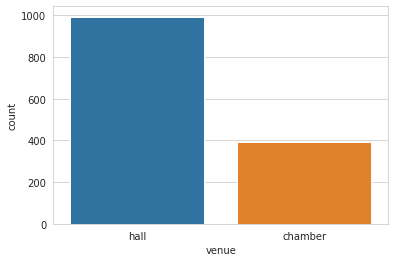

In [105]:
sns.countplot(data=train, x='venue')

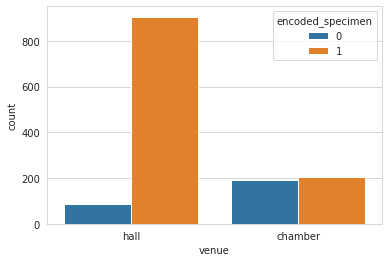

In [106]:
sns.countplot(data=train, x='venue', hue='encoded_specimen') # most of in_smoke class cases were predicted in hall environment

3.1.2. VENUE DISTRIBUTION IN VALIDATION DATA

In [107]:
val['venue'].value_counts()

hall       320
chamber    138
Name: venue, dtype: int64

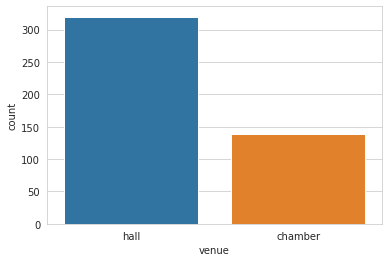

In [108]:
sns.countplot(data=val, x='venue')

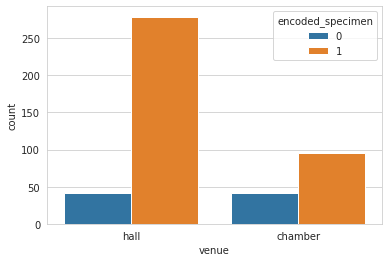

In [109]:
sns.countplot(data=val, x='venue', hue='encoded_specimen')

3.1.3. VENUE DISTRIBUTION IN TEST DATA

In [110]:
test['venue'].value_counts()

hall       477
chamber    174
Name: venue, dtype: int64

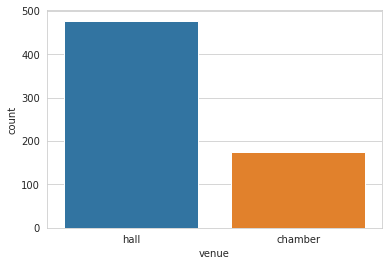

In [111]:
sns.countplot(data=test, x='venue')

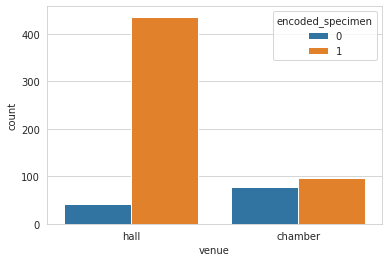

In [112]:
sns.countplot(data=test, x='venue', hue='encoded_specimen')

--------------------------------------------------------------------------------

--------------------------------------------------------------------------------



In [113]:
train_hall = train[train['venue']=='hall'] 
train_chamber = train[train['venue']=='chamber'] 

val_hall = val[val['venue']=='hall'] 
val_chamber = val[val['venue']=='chamber'] 

test_hall = test[test['venue']=='hall'] 
test_chamber = test[test['venue']=='chamber'] 

data_env = [train_hall, train_chamber, val_hall, val_chamber, test_hall, test_chamber]

for data in data_env:
  print(data.shape)

(994, 44)
(395, 44)
(320, 44)
(138, 44)
(477, 44)
(174, 44)


# **3.2. PLOT TEMPERATURE DISTRIBUTIONS**

In [114]:
def plot_temperature_distributions(train_hall, train_chamber, val_hall, val_chamber, test_hall, test_chamber):
  temp = ['temp_0', 'temp_1', 'temp_2', 'temp_3','temp_4', 'temp_5', 'temp_6', 'temp_7', 'temp_8', 'temp_9']

  fig, ax = plt.subplots(10, 6, sharex=True, sharey=True, figsize=(80,150), constrained_layout=True)

  for i in range(len(temp)):
    sns.distplot(ax=ax[i][0], x=train_hall[temp[i]])
    ax[i][0].set_title('Train, Hall: '+ temp[i], fontsize=25)

    sns.distplot(ax=ax[i][1], x=train_chamber[temp[i]])
    ax[i][1].set_title('Train, Chamber: '+ temp[i], fontsize=25)

    sns.distplot(ax=ax[i][2], x=val_hall[temp[i]])
    ax[i][2].set_title('Validation, Hall: '+ temp[i], fontsize=25)

    sns.distplot(ax=ax[i][3], x=val_chamber[temp[i]])
    ax[i][3].set_title('Validation, Chamber: '+ temp[i], fontsize=25)

    sns.distplot(ax=ax[i][4], x=test_hall[temp[i]])
    ax[i][4].set_title('Test, Hall: '+ temp[i], fontsize=25)

    sns.distplot(ax=ax[i][5], x=test_chamber[temp[i]])
    ax[i][5].set_title('Test, Chamber: '+ temp[i], fontsize=25)

In [115]:
plot_temperature_distributions(train_hall, train_chamber, val_hall, val_chamber, test_hall, test_chamber)

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function 

# **3.3. PLOT HUMIDITY DISTRIBUTIONS**

In [116]:
def plot_humidity_distributions(train_hall, train_chamber, val_hall, val_chamber, test_hall, test_chamber):
  humid = ['humid_0','humid_1','humid_2','humid_3','humid_4','humid_5','humid_6','humid_7','humid_8','humid_9']

  fig, ax = plt.subplots(10, 6, sharex=True, sharey=True, figsize=(80,150), constrained_layout=True)

  for i in range(len(humid)):
    sns.distplot(ax=ax[i][0], x=train_hall[humid[i]])
    ax[i][0].set_title('Train, Hall: '+ humid[i], fontsize=25)

    sns.distplot(ax=ax[i][1], x=train_chamber[humid[i]])
    ax[i][1].set_title('Train, Chamber: '+ humid[i], fontsize=25)

    sns.distplot(ax=ax[i][2], x=val_hall[humid[i]])
    ax[i][2].set_title('Validation, Hall: '+ humid[i], fontsize=25)

    sns.distplot(ax=ax[i][3], x=val_chamber[humid[i]])
    ax[i][3].set_title('Validation, Chamber: '+ humid[i], fontsize=25)

    sns.distplot(ax=ax[i][4], x=test_hall[humid[i]])
    ax[i][4].set_title('Test, Hall: '+ humid[i], fontsize=25)

    sns.distplot(ax=ax[i][5], x=test_chamber[humid[i]])
    ax[i][5].set_title('Test, Chamber: '+ humid[i], fontsize=25)

In [117]:
plot_humidity_distributions(train_hall, train_chamber, val_hall, val_chamber, test_hall, test_chamber)

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function 

# **3.4. PLOT GAS SCAN DISTRIBUTIONS**

In [118]:
def plot_gas_scan_distributions(train_hall, train_chamber, val_hall, val_chamber, test_hall, test_chamber):
  gas_scan = ['gas_scan_0', 'gas_scan_1', 'gas_scan_2', 'gas_scan_3', 'gas_scan_4', 'gas_scan_5', 'gas_scan_6', 'gas_scan_7', 'gas_scan_8', 'gas_scan_9']

  fig, ax = plt.subplots(10, 6, figsize=(80,150), constrained_layout=True)

  for i in range(len(gas_scan)):
    sns.distplot(ax=ax[i][0], x=train_hall[gas_scan[i]])
    ax[i][0].set_title('Train, Hall: '+ gas_scan[i], fontsize=25)

    sns.distplot(ax=ax[i][1], x=train_chamber[gas_scan[i]])
    ax[i][1].set_title('Train, Chamber: '+ gas_scan[i], fontsize=25)

    sns.distplot(ax=ax[i][2], x=val_hall[gas_scan[i]])
    ax[i][2].set_title('Validation, Hall: '+ gas_scan[i], fontsize=25)

    sns.distplot(ax=ax[i][3], x=val_chamber[gas_scan[i]])
    ax[i][3].set_title('Validation, Chamber: '+ gas_scan[i], fontsize=25)

    sns.distplot(ax=ax[i][4], x=test_hall[gas_scan[i]])
    ax[i][4].set_title('Test, Hall: '+ gas_scan[i], fontsize=25)

    sns.distplot(ax=ax[i][5], x=test_chamber[gas_scan[i]])
    ax[i][5].set_title('Test, Chamber: '+ gas_scan[i], fontsize=25)

In [119]:
plot_gas_scan_distributions(train_hall, train_chamber, val_hall, val_chamber, test_hall, test_chamber)

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function 

# **3.5. CORRELATION**

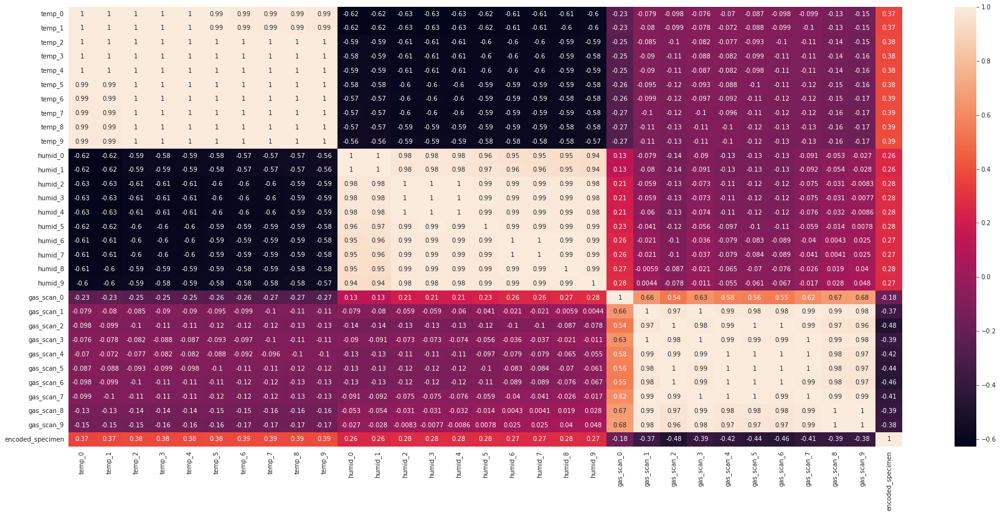

In [120]:
# train: hall

plt.figure(figsize=(30,13))
sns.heatmap(train_hall[columns_included].corr(), annot=True)

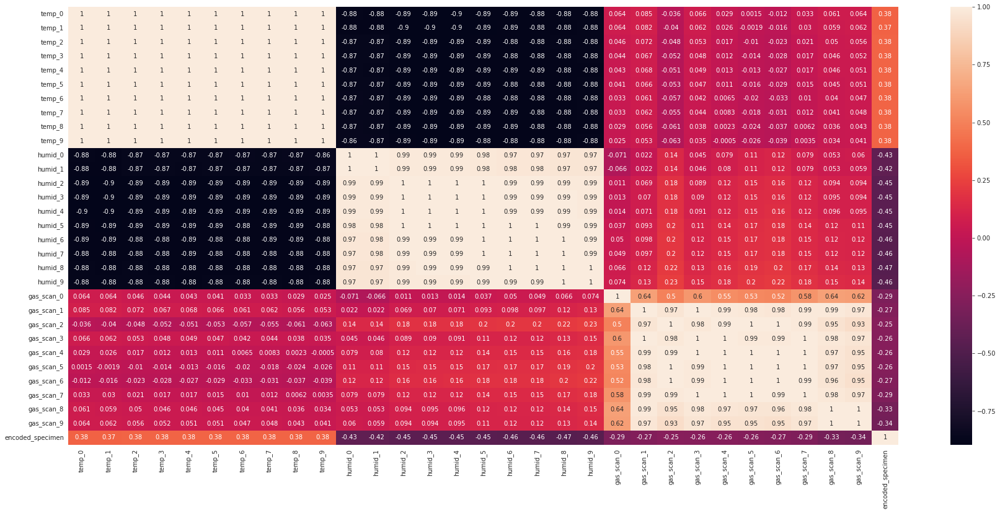

In [121]:
# train: chamber

plt.figure(figsize=(30,13))
sns.heatmap(train_chamber[columns_included].corr(), annot=True)

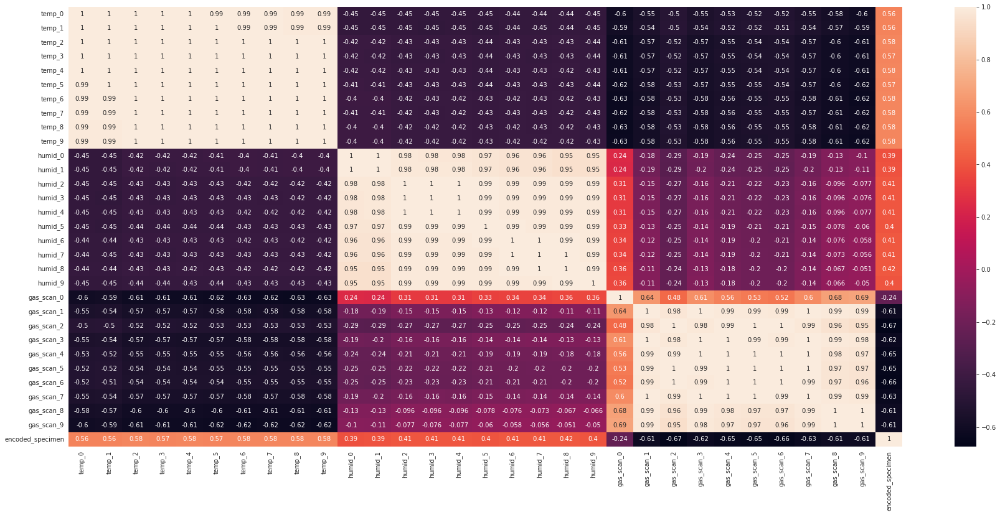

In [122]:
# validation: hall

plt.figure(figsize=(30,13))
sns.heatmap(val_hall[columns_included].corr(), annot=True)

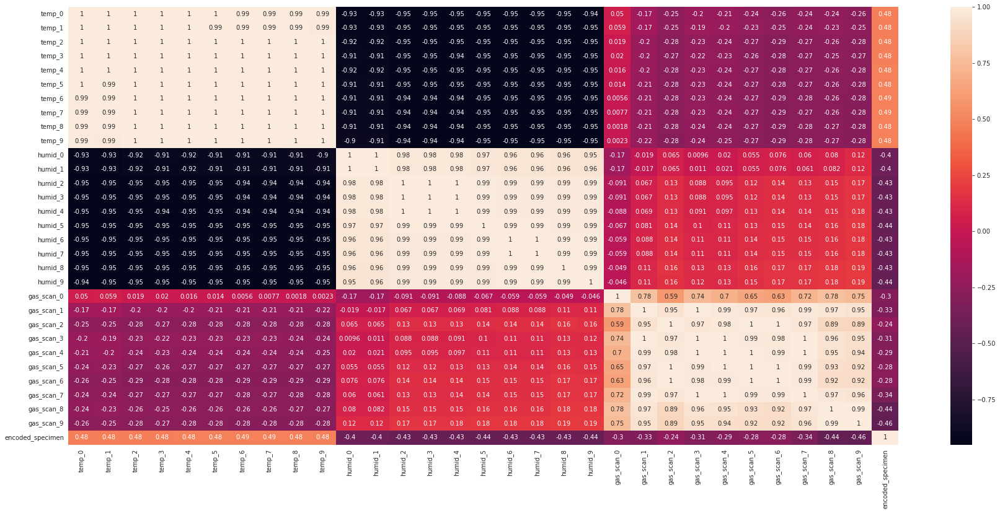

In [123]:
# validation: chamber

plt.figure(figsize=(30,13))
sns.heatmap(val_chamber[columns_included].corr(), annot=True)

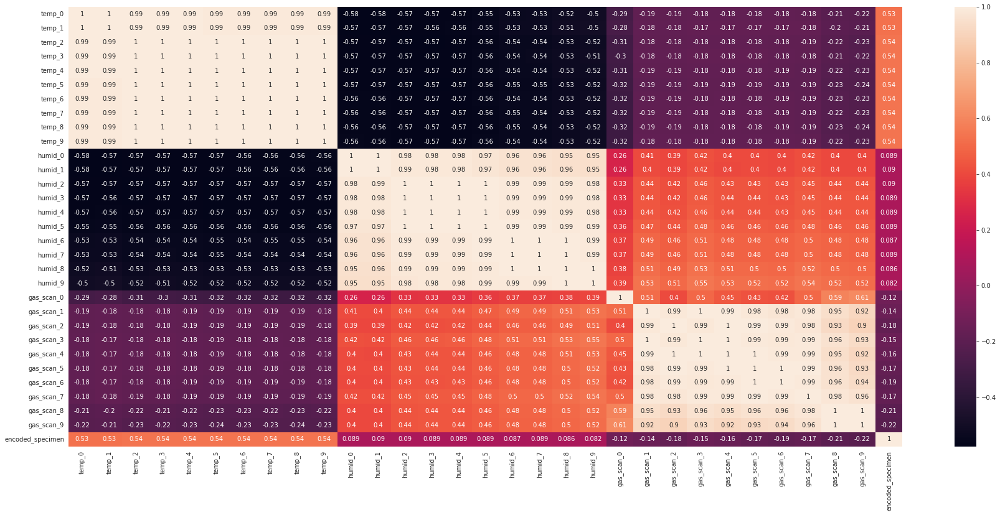

In [124]:
# test: hall

plt.figure(figsize=(30,13))
sns.heatmap(test_hall[columns_included].corr(), annot=True)

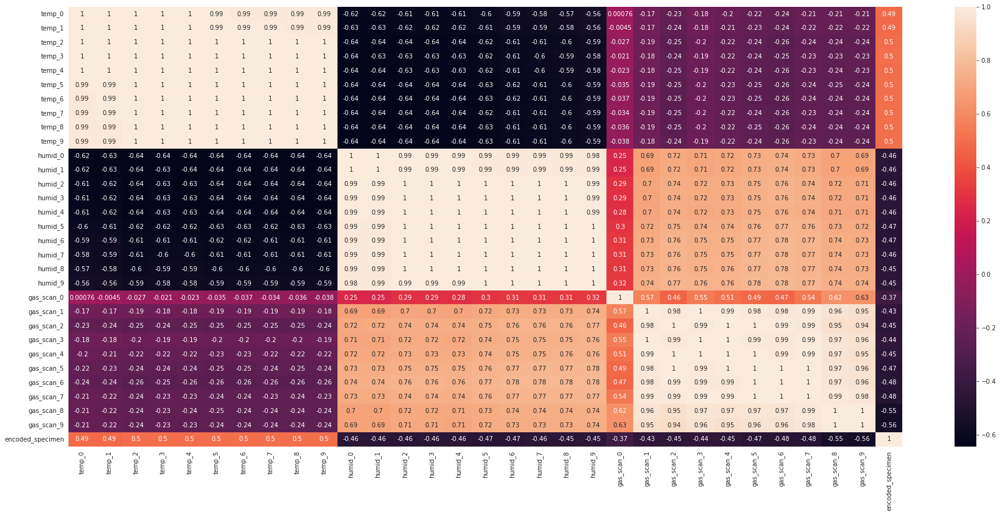

In [125]:
# test: chamber

plt.figure(figsize=(30,13))
sns.heatmap(test_chamber[columns_included].corr(), annot=True)

# **3.6. OUTLIERS**

In [138]:
def plot_outliers(train_hall, train_chamber, val_hall, val_chamber, test_hall, test_chamber, features):
  fig, ax = plt.subplots(10, 6, figsize=(80,150), constrained_layout=True)

  for i in range(len(features)):
    sns.boxplot(ax=ax[i][0], y=train_hall[features[i]], x=train_hall['encoded_specimen'])
    ax[i][0].set_title('Train, Hall: '+ features[i], fontsize=25)

    sns.boxplot(ax=ax[i][1], y=train_chamber[features[i]], x=train_chamber['encoded_specimen'])
    ax[i][1].set_title('Train, Chamber: '+ features[i], fontsize=25)

    sns.boxplot(ax=ax[i][2], y=val_hall[features[i]],  x=val_hall['encoded_specimen'])
    ax[i][2].set_title('Validation, Hall: '+ features[i], fontsize=25)

    sns.boxplot(ax=ax[i][3], y=val_chamber[features[i]], x=val_chamber['encoded_specimen'])
    ax[i][3].set_title('Validation, Chamber: '+ features[i], fontsize=25)

    sns.boxplot(ax=ax[i][4], y=test_hall[features[i]], x=test_hall['encoded_specimen'])
    ax[i][4].set_title('Test, Hall: '+ features[i], fontsize=25)

    sns.boxplot(ax=ax[i][5], y=test_chamber[features[i]], x=test_chamber['encoded_specimen'])
    ax[i][5].set_title('Test, Chamber: '+ features[i], fontsize=25)

In [135]:
train_hall.groupby(by='encoded_specimen')['temp_0'].count()

encoded_specimen
0     88
1    906
Name: temp_0, dtype: int64

In [139]:
temp = ['temp_0', 'temp_1', 'temp_2', 'temp_3','temp_4', 'temp_5', 'temp_6', 'temp_7', 'temp_8', 'temp_9']
plot_outliers(train_hall, train_chamber, val_hall, val_chamber, test_hall, test_chamber, temp)

In [140]:
humid = ['humid_0','humid_1','humid_2','humid_3','humid_4','humid_5','humid_6','humid_7','humid_8','humid_9']
plot_outliers(train_hall, train_chamber, val_hall, val_chamber, test_hall, test_chamber, humid)

In [141]:
gas_scan = ['gas_scan_0', 'gas_scan_1', 'gas_scan_2', 'gas_scan_3', 'gas_scan_4', 'gas_scan_5', 'gas_scan_6', 'gas_scan_7', 'gas_scan_8', 'gas_scan_9']
plot_outliers(train_hall, train_chamber, val_hall, val_chamber, test_hall, test_chamber, gas_scan)